# A BALANCED STEREO WIDENING NETWORK FOR HEADPHONES
Author: OLE KIRKEBY

- The network is balanced; there is a constraint on the sum of the magnitude responses of
    - corss-talk (left input to right output, and vice versa)
    - direct paths  (left input to left output, and so on)
    
- In order to ensure that only a minimum of **spectral colouration** is added to the original sound only frequencies below 2kHz are processed. 

- Headphone reproductin potentially offers very good control of what the listener hears.

- Headphone listening can cause
    - in-head localizatin and
    - fatigue
- The reason is not clear but many researchers agree on the theory; the audiotory system struggles with inputs that do not contain the **interaural time- and level differences** generated by physical sound sources.

    - Thus, such converting processing scheme should insert some **binaural cues**. 
    - However, certain types of spatial enhancement post-processing has a detrimental effect on the sound quality.
    - The advantages of a spatial enhancer must be weighted against the blurring and spectral colouration it adds to the source.
 
 
## 2. Filter design and implementation 

### 2.1. Stereo played back over loudspeakers
![IMG_1386](images/IMG_1386.jpg)
![IMG_1387](images/IMG_1387.jpeg)


![four_paths_from_two_loudspeakers_to_listener_diagram](images/four_paths_from_two_loudspeakers_to_listener_diagram.png)

- As illustrated in Figure 2, the direct path and the cross-talk path each has 
    - a frequency-dependent gain, $G_d$ and $G_x$ respectively, and 
    - a frequency-dependent delay, $t$ and $t+itd$ respectively
        - Difference between the two delays is the **interaural time difference** $itd$.
        - interaural time difference $itd$ is strictly speaking also dependent on the frequency but **we will assume that it is constant**. 
        - $itd$ is the most important cue for determining the location of a source in the horizontal plane. **For frontal sources $itd$ is zero, and zero for sources directly to the side of the listener**
        
#### $itd$ value
The value of the interaural time difference $itd$ affects the amount of widening perceived by the listener. The highest value encountered when listening to real sound sources is around 0.7ms(about 30 samples at 44.1kHz). To large $itd$ value, (>1ms), may result very unnatural sound.
        
- Given the size of the human head, we can **set $G_d$ and $G_x$ to one at frequencies below 1 kHz**, and **$G_d$ to two and $G_x$ to zero at high frequencies**. Thus, if neither $G_d$ and $G_x$ vary too rapidly in the transition band, the sum of $G_d$ and $G_x$ is always very close to two.
    - When an object object, such as the human head is positioned in an incident sound field, such as that produced by a loudspeaker, the sound field is not disturbed when the wave length is long compared to the size of the object.
    - At high frequencies, where the wavelength is short compared to the size of the object, there is a pressure build-up on the object's near side, and a pressure attenuation on the object's far side.
    
    
    

### 2.2 Binaural synthesis
Basically, it's an emulation of binaural sensation of loudspeakers on headphones. An **attempt to model natural listening with very good accuracy introduces noticable spectral colouration of the reproduced sound, particularly at frequencies above 3kHz**, and this colouration is unacceptable for high-fidelity music material.

**Note**: Spectral colouration means the filter effect is too much *audible*. The objective is to only localize the signal as if it was generated by loudspeakers not inside listener's head.

### 2.3 A balanced stereo widening network

The network is balanced, because the sum of the amplitudes of the two outputs is the same as the amplitude of the input. 
![magnitude_response_of_direct_cross](images/magnitude_response_of_direct_cross.png)

**In order to minimise processing artifacts**, in particular comb-filtering of the monophonic component at high frequencies, it is advantageous to **make the low-pass characteristic of $G_x$ more dramatic than the effect it emulates in real life**. Consequently, frequencies above 2kHz are considered *high*. 

-----------------
## IMPLEMENTATION

My stereo widening network is consisted of fractional a delay filter and shelving filter.

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 18   # Time and Hz, i.e. labels
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.labelsize'] = 18  # Time(x) tick values
plt.rcParams['ytick.labelsize'] = 18  # Hz(y) tick values
plt.rcParams['legend.fontsize'] = 17
plt.rcParams['figure.titlesize'] = 20
plt.rcParams['axes.titlesize'] = 20   # Title font
import numpy as np
from IPython.display import Audio, display
from scipy.io import wavfile
from scipy.signal import freqz, lfilter
import math

def is_stereo(ys):
    return len(ys.shape) == 2

def display_audio(ys, fs=44100):
    if is_stereo(ys) and ys.shape[1] == 2:
        ys = ys.T
    display(Audio(ys, rate=fs))

FS, source = wavfile.read('data/poker_face.wav')

First try mono audio on headset to feel in-head localisation.

In [4]:
def stereo_to_mono(filepath):
    """Convert a stereo audio wav file to "stereo-mono", 
    i.e. copy one side of audio array to the other side.
    
    """
    fs, samples = wavfile.read(filepath)
    samples_mono = np.expand_dims(samples[:,0], axis=1)
    samples_stereo_mono = np.concatenate(
        (samples_mono, samples_mono), 
        axis=1
    )
    new_filepath = filepath[:-4] + "_stereo_mono.wav"
    wavfile.write(new_filepath, rate=fs, data=samples_stereo_mono)
    print("Stereo")
    display(Audio(data=samples[fs*20:fs*40,:].T, rate=fs))
    print("Stereo-mono")
    display(Audio(samples_stereo_mono[fs*20:fs*40,:].T, rate=fs))
    return samples, samples_stereo_mono

stereo_to_mono('data/poker_face.wav')

Stereo


Stereo-mono


(array([[-2, -1],
        [ 1,  0],
        [-3, -1],
        ...,
        [-2,  4],
        [-1, -4],
        [ 0,  2]], dtype=int16), array([[-2, -2],
        [ 1,  1],
        [-3, -3],
        ...,
        [-2, -2],
        [-1, -1],
        [ 0,  0]], dtype=int16))

### Shelving filter as a linear phase lowpass filter

In [5]:
def shelving_1st_order(cut_off, gain, mode='low'):
    '''Shelving filter for bass
    
    Args:
        ys (numpy.array): 1D signals
        cut_off (float): Normalized cut-off frequency. 0 < cut_off < 1
        gain (float): gain in dB
    '''
    assert mode in ('low', 'high'), f"Invalide mode given: {mode}. Supports only 'low' and 'high'"
    
    gain        = 10 ** (gain / 20)          # NOTE: is it 20 or 40?
    wc          = 2 * np.pi * cut_off / 44100  # cut_off frequency in radians(0 <= wc <= pi)
    tan_term    = np.tan(wc / 2)
    gain_sqrt   = np.sqrt(gain)
    
    if mode == 'low':
        a0_prime = tan_term + gain_sqrt
        a1_prime = tan_term - gain_sqrt
        b0_prime = gain * tan_term + gain_sqrt
        b1_prime = gain * tan_term - gain_sqrt
    else:
        a0_prime = gain_sqrt * tan_term + 1
        a1_prime = gain_sqrt * tan_term - 1
        b0_prime = gain_sqrt * tan_term + gain
        b1_prime = gain_sqrt * tan_term - gain
    
    a = np.array([a0_prime, a1_prime]) / a0_prime
    b = np.array([b0_prime, b1_prime]) / a0_prime
    return b, a

def shelving_2nd_order(cut_off, gain, mode):
    '''Shelving filter for bass
    
    Args:
        ys (numpy.array): 1D signals
        cut_off (float): Normalized cut-off frequency. 0 < cut_off < 1
        gain (float): gain in dB
    '''
    assert mode in ('low', 'high'), f"Invalide mode given: {mode}. Supports only 'low' and 'high'"
    
    gain        = 10 ** (gain / 20)          # NOTE: is it 20 or 40?
    wc          = 2 * np.pi * cut_off / 44100  # cut_off frequency in radians(0 <= wc <= pi)
    omega    = np.tan(wc / 2)
    omega_squared = omega ** 2
    gain_sqrt   = np.sqrt(gain)
    gain_double_sqrt = np.sqrt(gain_sqrt)
    two_sqrt = np.sqrt(2)
    

    b0_prime = gain_sqrt*omega_squared + two_sqrt*omega*gain_double_sqrt + 1
    b1_prime = 2*(gain_sqrt*omega_squared - 1)
    b2_prime = gain_sqrt*omega_squared - two_sqrt*omega*gain_double_sqrt + 1

    a0_prime = gain_sqrt + two_sqrt*omega*gain_double_sqrt + omega_squared
    a1_prime = 2*(omega_squared - gain_sqrt)
    a2_prime = gain_sqrt - two_sqrt*omega*gain_double_sqrt + omega_squared
    
    if mode == 'low':
        b = np.array([b0_prime, b1_prime, b2_prime]) / a0_prime * gain_sqrt
        a = np.array([a0_prime, a1_prime, a2_prime]) / a0_prime
    else:
        # H_hs(z) = G /H_ls(z)
        b = np.array([a0_prime, a1_prime, a2_prime]) / b0_prime * gain_sqrt
        a = np.array([b0_prime, b1_prime, b2_prime]) / b0_prime
    
    return b, a


def get_filter_frequency_response(filter, cut_off, mode='low'):
    assert mode in ('low', 'high'), f"Invalide mode given: {mode}. Supports only 'low' and 'high'"
    gains = (4, 8, 12)
    colors = ('r', 'g', 'b')
    nfft = 2**14
    samplerate = 44100

    fig, ax1 = plt.subplots(figsize = (10, 6))
    ax1.set_title(f'{filter.__name__} filter {mode}-pass magnitude response. Cut-off @ {cut_off} Hz')

    for g, c in zip(gains, colors):
        #-------------------------------------------------
        # Plot the positive gain
        b, a = filter(cut_off=cut_off, gain=g, mode=mode)
        w, h = freqz(b, a, nfft, whole=False)

        w *= 0.5 * samplerate / np.pi

        # plot amplitude in dB and frequency on log scale (essentially log-log)
        # we were right, just looking at it wrong
        ax1.semilogx(w, 20 * np.log10(abs(h)), c)
        ax1.set_ylabel('Amplitude [dB]', color=c)
        ax1.set_xlabel('Frequency [Hz]')

        #-------------------------------------------------
        # Plot the negative gain
        b, a = filter(cut_off=cut_off, gain=-g, mode=mode)
        w, h = freqz(b, a, nfft, whole=False)

        w *= 0.5 * samplerate / np.pi

        # plot amplitude in dB and frequency on log scale (essentially log-log)
        # we were right, just looking at it wrong
        ax1.semilogx(w, 20 * np.log10(abs(h)), c)
        ax1.set_ylabel('Amplitude [dB]', color=c)
        ax1.set_xlabel('Frequency [Hz]')

    ax1.axvline(x=cut_off, label=f'cut-off at {cut_off} Hz', linestyle=(0, (5, 5)), color='black')

    from datetime import datetime
    plt.savefig(f'plots/cut-off-{cut_off}Hz_{datetime.now()}.png')

    
def get_filter_phase_response(filter, cut_off, mode='low'):
    assert mode in ('low', 'high'), f"Invalide mode given: {mode}. Supports only 'low' and 'high'"
    gains = (4, 8, 12)
    colors = ('r', 'g', 'b')
    nfft = 2**14
    samplerate = 44100

    fig, ax1 = plt.subplots(figsize = (10, 6))
    ax1.set_title(f'{filter.__name__} filter {mode}-pass magnitude response. Cut-off @ {cut_off} Hz')

    for g, c in zip(gains, colors):
        #-------------------------------------------------
        # Plot the positive gain
        b, a = filter(cut_off=cut_off, gain=g, mode=mode)
        w, h = freqz(b, a, nfft, whole=False)

        w *= 0.5 * samplerate / np.pi

        # plot amplitude in dB and frequency on log scale (essentially log-log)
        # we were right, just looking at it wrong
        ax1.semilogx(w, 20 * np.log10(np.angle(h)), c)
        ax1.set_ylabel('Phase', color=c)
        ax1.set_xlabel('Frequency [Hz]')

        #-------------------------------------------------
        # Plot the negative gain
        b, a = filter(cut_off=cut_off, gain=-g, mode=mode)
        w, h = freqz(b, a, nfft, whole=False)

        w *= 0.5 * samplerate / np.pi

        # plot amplitude in dB and frequency on log scale (essentially log-log)
        # we were right, just looking at it wrong
        ax1.semilogx(w, 20 * np.log10(np.angle(h)), c)
        ax1.set_ylabel('Phase', color=c)
        ax1.set_xlabel('Frequency [Hz]')

    ax1.axvline(x=cut_off, label=f'cut-off at {cut_off} Hz', linestyle=(0, (5, 5)), color='black')

    from datetime import datetime
    plt.savefig(f'plots/cut-off-{cut_off}Hz_{datetime.now()}.png')

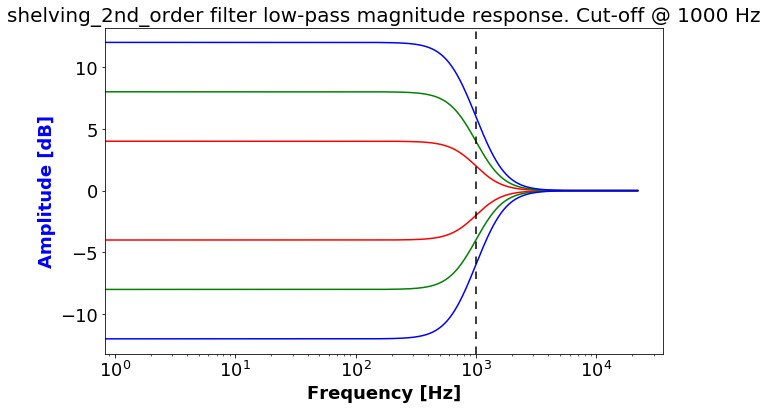

In [6]:
# Magnitude response 
get_filter_frequency_response(shelving_2nd_order, 1000, mode='low')

/Users/parks1/miniconda3/envs/asp/lib/python3.7/site-packages/ipykernel_launcher.py:132: RuntimeWarning: divide by zero encountered in log10
/Users/parks1/miniconda3/envs/asp/lib/python3.7/site-packages/ipykernel_launcher.py:132: RuntimeWarning: invalid value encountered in log10
/Users/parks1/miniconda3/envs/asp/lib/python3.7/site-packages/ipykernel_launcher.py:145: RuntimeWarning: divide by zero encountered in log10


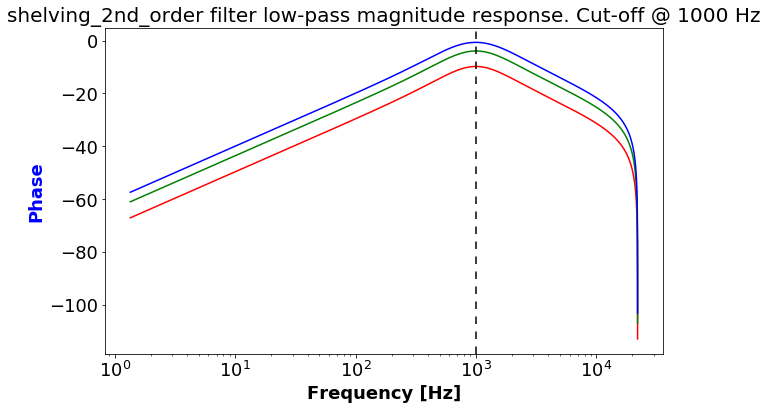

In [7]:
# Phase response 
get_filter_phase_response(shelving_2nd_order, 1000, mode='low')

### Fractional-delay filter as a group delay

Text(0.5, 1.0, 'Numerator coeff. of Fractinal Delay Transfer function. D = 300.343')

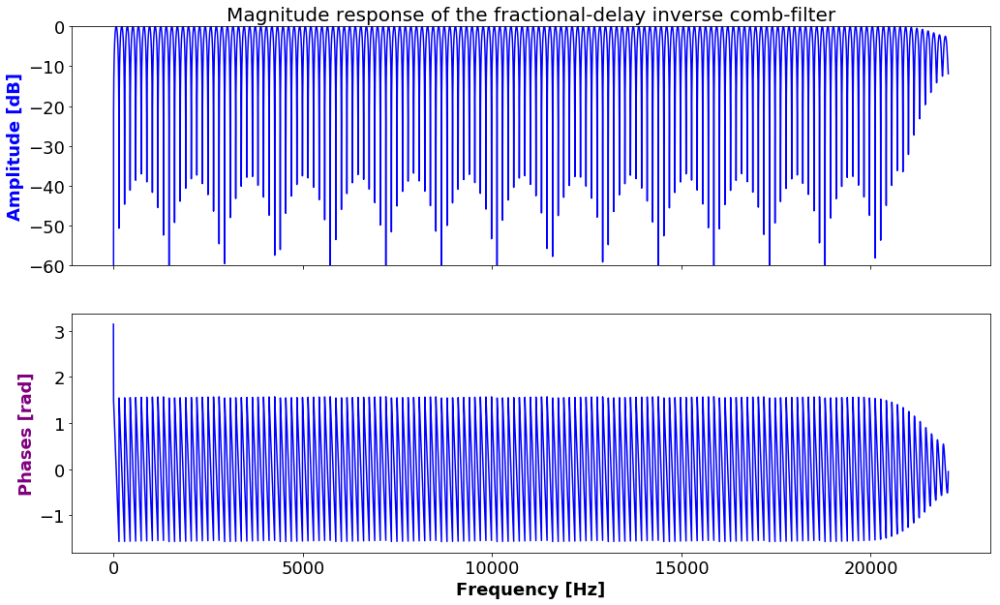

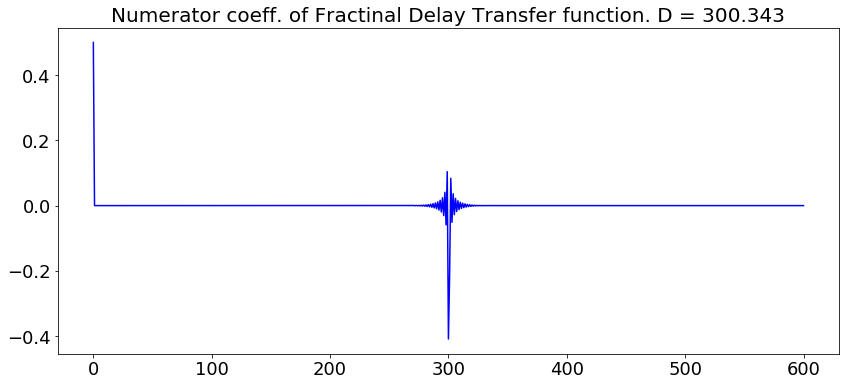

In [6]:
def n_th_order_transfer_function(D, N=160):
    """
    Args:
        D = 174.3   # Frequency to remove
        N = 160     # Chunk size
    """
    h = np.zeros(N+1)
    for n in range(N+1):                                               
        """Calculate largrange interpolation in vectorized form"""
        ks = np.arange(N+1)
        
        # Skip the k = n in order to avoid zero division error
        h[n] = np.prod( (D-ks[:n])/(n-ks[:n]) ) \
             * np.prod( (D-ks[n+1:])/(n-ks[n+1:]) ) 
        
    return h


def fractional_delay(f0, fs=44100):
    #-------------------------------------------------
    # Get Lagrange interpolation
    D = fs / f0
    
    '''
    NOTE: The original paper notes, `N = 160`. However, 
    that value did not work for us and we just landed on random 
    value by trial and error.
    '''
    N = int(2*D)   
    
    # Numerators/Coefficients of FIR filter
    b_L = n_th_order_transfer_function(D=D, N=N)
    
    # Numerators of delay
    b_delay = np.zeros_like(b_L)
    b_delay[0] = 1
    
    # This is the final numerator of the transfer function
    b = 1/2 * (b_delay - b_L)   

    nfft = 2**14
    #-------------------------------------------------
    # Output of freqz()
    # w : ndarray
    #     The frequencies at which `h` was computed, in the same units as `fs`.
    #     By default, `w` is normalized to the range [0, pi) (radians/sample).
    # h : ndarray
    #     The frequency response, as complex numbers.
    w, H = freqz(b=b, worN=nfft, whole=False)
        
    H_dB = 20 * np.log10(abs(H)) # abs() converts a complex number to a real number.
    
    w *= 0.5 * fs / np.pi        # Renormalize `w` to Nyquist sample rate
    
    return b, w, H_dB, np.angle(H)

f0=146.832
b, w, H, phases = fractional_delay(f0) 
f, axarr = plt.subplots(2, sharex=True, figsize=(17, 10))
# Plot magnitude
axarr[0].plot(w, H, 'blue')
axarr[0].set_ylabel('Amplitude [dB]', color='blue')
axarr[0].set_ylim([-60,0])
axarr[0].set_title('Magnitude response of the fractional-delay inverse comb-filter')
# Plot angles/phases
axarr[1].plot(w, phases, 'blue')
axarr[1].set_ylabel('Phases [rad]', color='purple')
plt.xlabel('Frequency [Hz]')

D = 44100 / f0
plt.figure(figsize=(14,6))
plt.plot(b, 'blue')
plt.title('Numerator coeff. of Fractinal Delay Transfer function. D = {:.3f}'.format(D))



### Stereo widening network

![stereo-widening-network](images/stereo-widening-network.png)


Stereo-widened


Source


Saved the result as 'widened.wav'


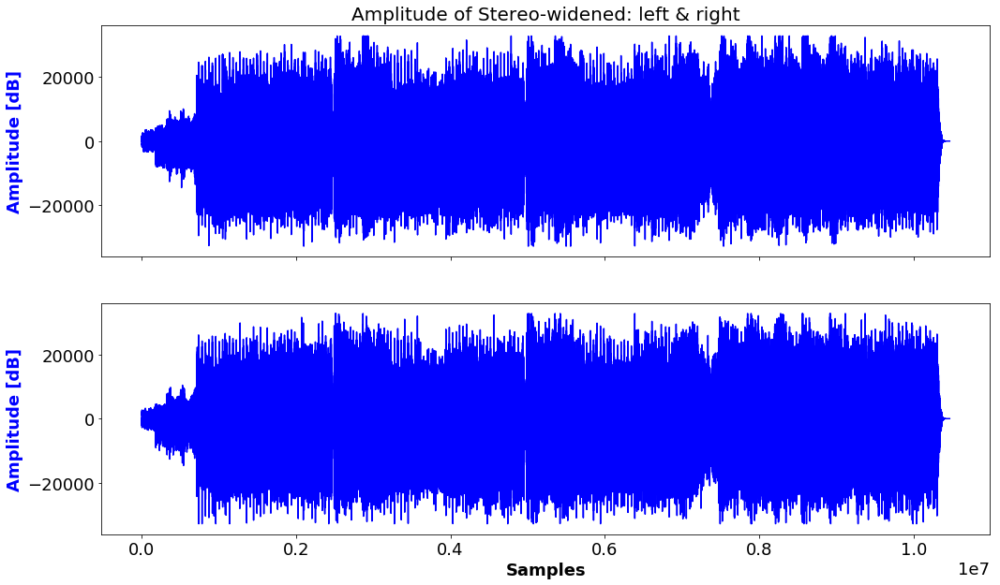

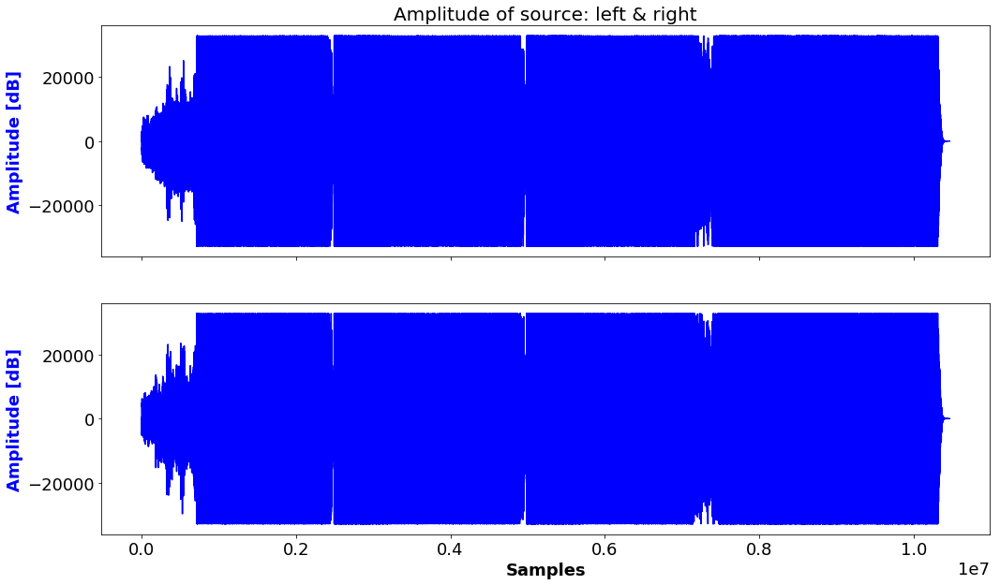

In [10]:
fs = 44100
itd = 0.0007 # Interaural Time Difference. 
             # 0 when the loud speaker is in front and
             # 0.7 ms (30 samples in 44.1 kHz) when on the side
             # 0 < `itd` < 1 ms
itd_in_freq = 1 / itd

group_delay_in_sec = 0.00025     # Groupd delay of the lowpass filter. 0.25 ms
group_delay_in_freq = 1 / group_delay_in_sec 
group_delay_in_sample = math.floor(group_delay_in_sec *(fs)); # Paper uses 10 samples, here it's 11

def make_stereo(ys1, ys2):
    return np.concatenate(
        (
            ys1.reshape([-1, 1]), 
            ys2.reshape([-1, 1])
        ), 
        axis=1
    )    

def stereo_widening_network(ys):
    ys_left = ys[:,0]
    ys_right = ys[:,1]
    
    def single_virtual_loudspeaker(ys):
        # Lowpass
        b, a = shelving_2nd_order(cut_off=2000, gain=-100, mode='high')
        ys_cross = lfilter(b, a, ys) * 0.5
        
        # Group delay for Direct
        b, w, H, phases = fractional_delay(group_delay_in_freq)
        ys_direct = lfilter(b, [1], ys)
        ys_direct -= ys_cross
        
        # Group delay for Cross
        b, w, H, phases = fractional_delay(itd_in_freq)
        ys_cross = lfilter(b, [1], ys_cross)
        
        return ys_direct, ys_cross
    
    def cut_off_magnitude_over_range(ys):
        ys[np.where(ys>32767)] = 32767
        ys[np.where(ys<-32768)] = -32768
        
        return ys
    
    ys_left_direct, ys_left_cross = single_virtual_loudspeaker(ys_left)
    ys_right_direct, ys_right_cross = single_virtual_loudspeaker(ys_right)
    
    ys_left = ys_left_direct + ys_right_cross
    ys_right = ys_right_direct + ys_left_cross
    
    ys_left = cut_off_magnitude_over_range(ys_left)
    ys_right = cut_off_magnitude_over_range(ys_right)
    
    ys_widened = make_stereo(ys_left, ys_right)
    
    ys_widened = ys_widened.astype(np.int16)
     
    return ys_widened

widened =  stereo_widening_network(source)


f, axarr = plt.subplots(2, sharex=True, figsize=(17, 10))
# Plot magnitude
axarr[0].plot(widened[:,0], 'blue')
axarr[0].set_ylabel('Amplitude [dB]', color='blue')
axarr[0].set_title('Amplitude of Stereo-widened: left & right')
# Plot angles/phases
axarr[1].plot(widened[:,1], 'blue')
axarr[1].set_ylabel('Amplitude [dB]', color='blue')
plt.xlabel('Samples')

print("Stereo-widened")
display_audio(widened[FS*40:FS*60,:])

f, axarr = plt.subplots(2, sharex=True, figsize=(17, 10))
# Plot magnitude
axarr[0].plot(source[:,0], 'blue')
axarr[0].set_ylabel('Amplitude [dB]', color='blue')
axarr[0].set_title('Amplitude of source: left & right')
# Plot angles/phases
axarr[1].plot(source[:,1], 'blue')
axarr[1].set_ylabel('Amplitude [dB]', color='blue')
plt.xlabel('Samples')

print("Source")
display_audio(source[FS*40:FS*60,:])

wavfile.write('widened.wav', rate=44100, data=widened)
print("Saved the result as 'widened.wav'")

## Discussion
I implemented a stereo widening network. The output of the network conveys more spatial feeling, i.e. it has weakened the in-head localisation, when listened on a headphone. However, the output has lost some fidelity.

## Acknowledgement
I appreciate Eero-Pekka Damskägg and Uljas Pulkkis for their valuable advice for the assignment. All code was implemented solely by Seyoung Park.

## References
- A BALANCED STEREO WIDENING NETWORK FOR HEADPHONES by Ole Kirkeby